# Trajectory Graph EDA

Exploratory analysis of the **trajectory-based street graph** for UrbanRoamVQA. This graph reverse-engineers the Cyclomedia Street Smart viewer's dual navigation system:

1. **Route-based (LRS analog):** Reconstruct capture vehicle passes from `recordedAt` timestamps, chain sequential recordings within each pass.
2. **Spatial scoring:** Connect cross-pass recordings using the **actual Street Smart scoring function** extracted from `StreetSmartApi.js`: `S(dist, angle) = angle > π/4 ? -1 : (1 - angle/π) / (1 + 0.1·√dist)`
3. **Component bridging:** Merge any disconnected fragments to ensure global traversability.

**Key questions:**
1. How well does pass segmentation work? Are passes clean single-street traversals?
2. How does the Street Smart scoring compare to the old heading-diff heuristic for cross-pass edges?
3. Is the graph globally connected? Can walks traverse indefinitely without getting stuck?
4. What do the temporal patterns of capture look like?

In [1]:
import sys
from pathlib import Path
from types import SimpleNamespace

PROJECT_ROOT = str(Path("../..").resolve())
if PROJECT_ROOT not in sys.path:
    sys.path.insert(0, PROJECT_ROOT)

import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter, defaultdict

try:
    import folium
    FOLIUM_OK = True
except ImportError:
    FOLIUM_OK = False
    print("folium not installed — map cells will use matplotlib fallback")

plt.style.use("seaborn-v0_8-whitegrid")
plt.rcParams["figure.dpi"] = 120
plt.rcParams["figure.facecolor"] = "white"

PARQUET_PATH = "../../data/cyclomedia/manhattan_2025_1_1k_scratch.parquet"

## 1. Raw Temporal Patterns

Before building the graph, examine the capture timestamps and vehicle headings to understand the raw data.

In [2]:
# Load and deduplicate to unique recordings
raw = pd.read_parquet(PARQUET_PATH)
recs = raw.drop_duplicates(subset=["recording_id"]).reset_index(drop=True)
recs["ts"] = pd.to_datetime(recs["recordedAt"], utc=True)
recs["lat"] = pd.to_numeric(recs.get("lat", recs.get("latitude")), errors="coerce")
recs["lon"] = pd.to_numeric(recs.get("lon", recs.get("longitude")), errors="coerce")
recs["heading"] = pd.to_numeric(recs["recorderDirection"], errors="coerce") % 360.0
recs = recs.sort_values("ts").reset_index(drop=True)

print(f"Unique recordings: {len(recs):,}")
print(f"Time range: {recs['ts'].min()} → {recs['ts'].max()}")
print(f"recordedAt nulls: {recs['ts'].isna().sum()}")
print(f"recorderDirection nulls: {recs['heading'].isna().sum()}")

Unique recordings: 259,946
Time range: 2025-08-01 15:22:44.040000+00:00 → 2025-10-12 13:27:33.520000+00:00
recordedAt nulls: 0
recorderDirection nulls: 0


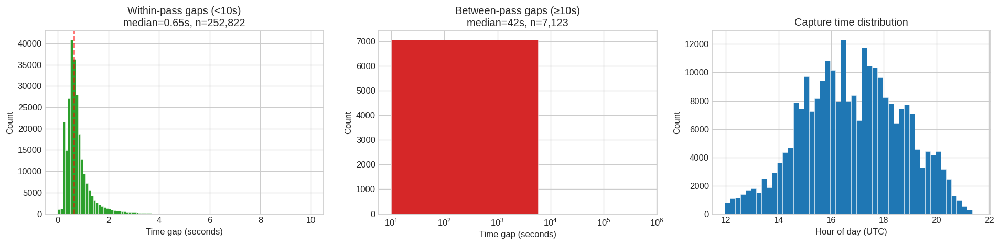

Time gap percentiles:
  P25: 0.49s
  P50: 0.66s
  P75: 0.93s
  P90: 1.55s
  P95: 2.66s
  P99: 51.94s


In [3]:
# Inter-recording time gaps (sorted by timestamp)
time_diffs_s = recs["ts"].diff().dt.total_seconds().dropna().values

fig, axes = plt.subplots(1, 3, figsize=(16, 4))

# Within-pass gaps (< 10s)
ax = axes[0]
within = time_diffs_s[time_diffs_s < 10]
ax.hist(within, bins=100, color="#2ca02c", edgecolor="white", linewidth=0.3)
ax.set_xlabel("Time gap (seconds)")
ax.set_ylabel("Count")
ax.set_title(f"Within-pass gaps (<10s)\nmedian={np.median(within):.2f}s, n={len(within):,}")
ax.axvline(np.median(within), color="red", linestyle="--", alpha=0.7)

# Between-pass gaps (≥ 10s)
ax = axes[1]
between = time_diffs_s[time_diffs_s >= 10]
ax.hist(between, bins=100, color="#d62728", edgecolor="white", linewidth=0.3)
ax.set_xlabel("Time gap (seconds)")
ax.set_ylabel("Count")
ax.set_title(f"Between-pass gaps (≥10s)\nmedian={np.median(between):.0f}s, n={len(between):,}")
ax.set_xscale("log")

# Capture time-of-day
ax = axes[2]
hours = recs["ts"].dt.hour + recs["ts"].dt.minute / 60
ax.hist(hours, bins=48, color="#1f77b4", edgecolor="white", linewidth=0.3)
ax.set_xlabel("Hour of day (UTC)")
ax.set_ylabel("Count")
ax.set_title("Capture time distribution")

plt.tight_layout()
plt.show()

print(f"Time gap percentiles:")
for p in [25, 50, 75, 90, 95, 99]:
    print(f"  P{p}: {np.percentile(time_diffs_s, p):.2f}s")

## 2. Build Trajectory Graph

Build the graph using `build_trajectory_graph()` with default parameters: pass segmentation → along-pass edges → Street Smart spatial scoring → component bridging.

In [4]:
from dagspaces.urbanroamvqa.graph.builder import (
    build_trajectory_graph, _haversine_m, _bearing_deg,
    _normalize_yaw_from_recorder_direction,
)
from dagspaces.urbanroamvqa.graph.street_graph import StreetGraph, Neighbor

cfg = SimpleNamespace(
    graph_type="trajectory",
    yaw_column="recorderDirection",
    pass_time_gap_s=10.0,
    pass_distance_gap_m=100.0,
    pass_heading_gap_deg=90.0,
    spatial_radius_m=30.0,
    max_spatial_neighbors=4,
    max_along_pass_distance_m=50.0,
    subsample_spacing_m=0,
    bridge_components=True,
    bridge_radius_m=500.0,
    precomputed_path=None,
)

graph = build_trajectory_graph(PARQUET_PATH, cfg)

[trajectory_graph] Loading metadata from ../../data/cyclomedia/manhattan_2025_1_1k_scratch.parquet
[trajectory_graph] 259,946 unique recordings with timestamps
[trajectory_graph] Segmented into 15,800 vehicle passes
[trajectory_graph] Pass sizes: median=6, mean=16.5, max=1530, single-recording passes=4236
[trajectory_graph] Along-pass edges: 244,020 (bidirectional)
[trajectory_graph] Cross-pass spatial edges (Street Smart scored): 636,322
[trajectory_graph] Found 815 disconnected components, bridging...
[trajectory_graph] Bridge edges: 810 (merged 815 → ~1 component)
[trajectory_graph] Built: 259,946 nodes, 1,762,304 edges (avg degree 6.8), 244,020 along-pass + 636,322 spatial, 202,766 nodes with turn options (degree > 2)


In [5]:
# Re-run pass segmentation to get pass labels for analysis
# (the builder doesn't expose these, so we replicate the logic here)
lats_sorted = recs["lat"].values.astype(float)
lons_sorted = recs["lon"].values.astype(float)
headings_sorted = recs["heading"].values.astype(float)
ts_sorted = recs["ts"].values
rids_sorted = recs["recording_id"].values.astype(str)

pass_ids = np.zeros(len(recs), dtype=np.int64)
current_pass = 0
for i in range(1, len(recs)):
    dt_s = (ts_sorted[i] - ts_sorted[i - 1]) / np.timedelta64(1, "s")
    dist_m = _haversine_m(lats_sorted[i - 1], lons_sorted[i - 1],
                          lats_sorted[i], lons_sorted[i])
    hdg_diff = abs(headings_sorted[i] - headings_sorted[i - 1])
    hdg_diff = min(hdg_diff, 360.0 - hdg_diff)

    if dt_s > 10.0 or dist_m > 100.0 or hdg_diff > 90.0:
        current_pass += 1
    pass_ids[i] = current_pass

recs["pass_id"] = pass_ids
n_passes = current_pass + 1
print(f"Passes: {n_passes:,}")

Passes: 15,800


### Street Smart Scoring Function

The actual scoring function extracted from `StreetSmartApi.js v26.1`:

```
S(distance, angle) = angle > π/4 ? -1 : (1 - angle/π) / (1 + 0.1·√distance)
```

Visualize how it trades off distance vs angular deviation.

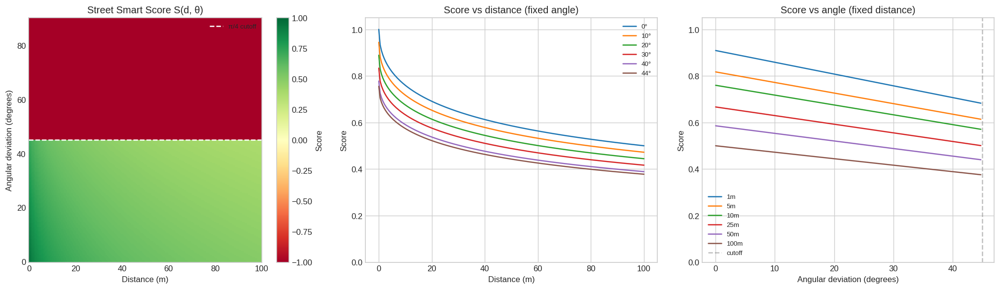

Score examples:
  d=  5m, θ= 0° → S=0.817
  d=  5m, θ=20° → S=0.726
  d=  5m, θ=44° → S=0.617
  d= 10m, θ= 0° → S=0.760
  d= 10m, θ=30° → S=0.633
  d= 25m, θ= 0° → S=0.667
  d= 25m, θ=20° → S=0.593
  d= 50m, θ= 0° → S=0.586
  d= 50m, θ=30° → S=0.488


In [6]:
def streetsmart_score(distance_m, angle_rad):
    """Street Smart navigation scoring function (from StreetSmartApi.js)."""
    if angle_rad > math.pi / 4:
        return -1.0
    return (1.0 - angle_rad / math.pi) / (1.0 + 0.1 * math.sqrt(distance_m))

# Heatmap: score as function of distance and angle
distances = np.linspace(0, 100, 200)
angles_deg = np.linspace(0, 90, 200)
angles_rad = np.radians(angles_deg)

D, A = np.meshgrid(distances, angles_rad)
S = np.vectorize(streetsmart_score)(D, A)

fig, axes = plt.subplots(1, 3, figsize=(17, 5))

# Heatmap
ax = axes[0]
im = ax.pcolormesh(distances, angles_deg, S, cmap="RdYlGn", vmin=-1, vmax=1, shading="auto")
ax.axhline(45, color="white", linestyle="--", linewidth=1.5, label="π/4 cutoff")
ax.set_xlabel("Distance (m)")
ax.set_ylabel("Angular deviation (degrees)")
ax.set_title("Street Smart Score S(d, θ)")
ax.legend(loc="upper right", fontsize=8)
plt.colorbar(im, ax=ax, label="Score")

# Score vs distance at fixed angles
ax = axes[1]
for angle_d in [0, 10, 20, 30, 40, 44]:
    angle_r = math.radians(angle_d)
    scores = [(1 - angle_r / math.pi) / (1 + 0.1 * math.sqrt(d)) for d in distances]
    ax.plot(distances, scores, label=f"{angle_d}°", linewidth=1.5)
ax.set_xlabel("Distance (m)")
ax.set_ylabel("Score")
ax.set_title("Score vs distance (fixed angle)")
ax.legend(fontsize=8)
ax.set_ylim(0, 1.05)

# Score vs angle at fixed distances
ax = axes[2]
valid_angles = angles_deg[angles_deg <= 45]
valid_rad = np.radians(valid_angles)
for d in [1, 5, 10, 25, 50, 100]:
    scores = [(1 - a / math.pi) / (1 + 0.1 * math.sqrt(d)) for a in valid_rad]
    ax.plot(valid_angles, scores, label=f"{d}m", linewidth=1.5)
ax.axvline(45, color="gray", linestyle="--", alpha=0.5, label="cutoff")
ax.set_xlabel("Angular deviation (degrees)")
ax.set_ylabel("Score")
ax.set_title("Score vs angle (fixed distance)")
ax.legend(fontsize=8)
ax.set_ylim(0, 1.05)

plt.tight_layout()
plt.show()

# Key thresholds
print("Score examples:")
for d, a in [(5, 0), (5, 20), (5, 44), (10, 0), (10, 30), (25, 0), (25, 20), (50, 0), (50, 30)]:
    s = streetsmart_score(d, math.radians(a))
    print(f"  d={d:>3}m, θ={a:>2}° → S={s:.3f}")

## 3. Pass Statistics

Analyze the structure of reconstructed vehicle passes: how long are they, how many recordings per pass, and what causes pass breaks?

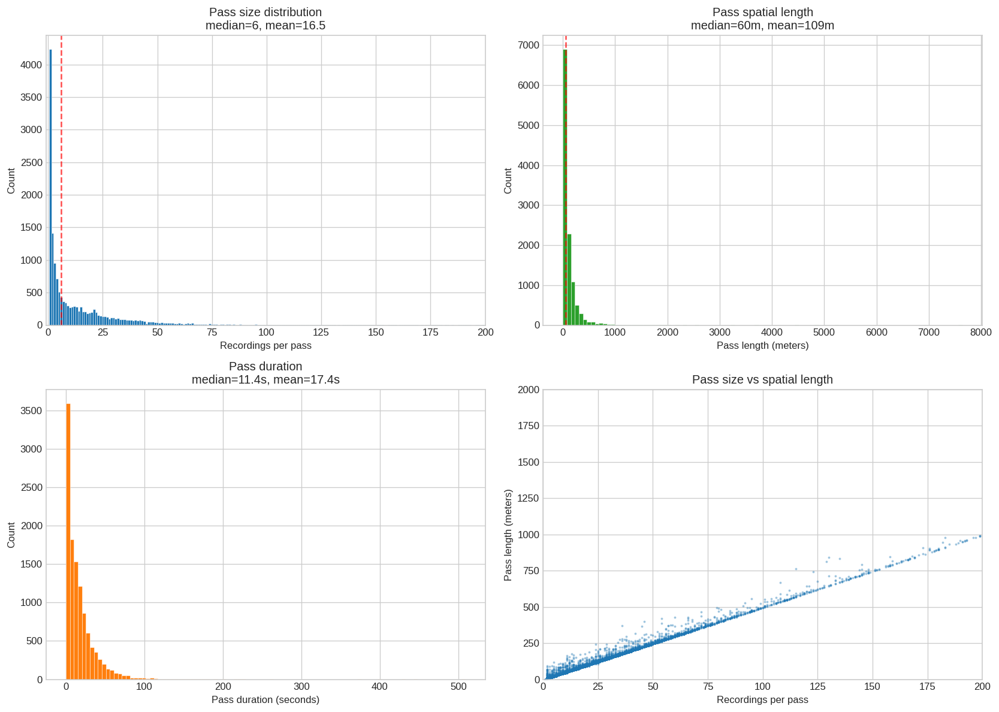

Single-recording passes: 4,236 (26.8%)
Passes with ≥5 recordings: 8,486 (53.7%)
Passes with ≥20 recordings: 4,136 (26.2%)
Longest pass: 1530 recordings, 7642m


In [7]:
# Compute per-pass statistics
pass_stats = recs.groupby("pass_id").agg(
    n_recs=("recording_id", "count"),
    duration_s=("ts", lambda x: (x.max() - x.min()).total_seconds()),
    lat_min=("lat", "min"), lat_max=("lat", "max"),
    lon_min=("lon", "min"), lon_max=("lon", "max"),
    heading_mean=("heading", "mean"),
).reset_index()

# Compute total spatial length of each pass (sum of consecutive haversine distances)
pass_lengths = []
for pid in range(n_passes):
    mask = recs["pass_id"] == pid
    plats = lats_sorted[mask]
    plons = lons_sorted[mask]
    total = sum(_haversine_m(plats[i], plons[i], plats[i+1], plons[i+1])
                for i in range(len(plats) - 1)) if len(plats) > 1 else 0.0
    pass_lengths.append(total)
pass_stats["length_m"] = pass_lengths

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Pass size distribution
ax = axes[0, 0]
sizes = pass_stats["n_recs"].values
ax.hist(sizes, bins=np.arange(0, min(200, sizes.max()) + 2) - 0.5,
        color="#1f77b4", edgecolor="white", linewidth=0.3)
ax.set_xlabel("Recordings per pass")
ax.set_ylabel("Count")
ax.set_title(f"Pass size distribution\nmedian={np.median(sizes):.0f}, mean={np.mean(sizes):.1f}")
ax.axvline(np.median(sizes), color="red", linestyle="--", alpha=0.7)
ax.set_xlim(-1, 200)

# Pass length (meters)
ax = axes[0, 1]
lengths = pass_stats["length_m"].values
lengths_nonzero = lengths[lengths > 0]
ax.hist(lengths_nonzero, bins=100, color="#2ca02c", edgecolor="white", linewidth=0.3)
ax.set_xlabel("Pass length (meters)")
ax.set_ylabel("Count")
ax.set_title(f"Pass spatial length\nmedian={np.median(lengths_nonzero):.0f}m, mean={np.mean(lengths_nonzero):.0f}m")
ax.axvline(np.median(lengths_nonzero), color="red", linestyle="--", alpha=0.7)

# Pass duration
ax = axes[1, 0]
durations = pass_stats["duration_s"].values
durations_nonzero = durations[durations > 0]
ax.hist(durations_nonzero, bins=100, color="#ff7f0e", edgecolor="white", linewidth=0.3)
ax.set_xlabel("Pass duration (seconds)")
ax.set_ylabel("Count")
ax.set_title(f"Pass duration\nmedian={np.median(durations_nonzero):.1f}s, mean={np.mean(durations_nonzero):.1f}s")

# Size vs length scatter
ax = axes[1, 1]
ax.scatter(pass_stats["n_recs"], pass_stats["length_m"], s=2, alpha=0.3, c="#1f77b4")
ax.set_xlabel("Recordings per pass")
ax.set_ylabel("Pass length (meters)")
ax.set_title("Pass size vs spatial length")
ax.set_xlim(0, 200)
ax.set_ylim(0, 2000)

plt.tight_layout()
plt.show()

print(f"Single-recording passes: {(sizes == 1).sum():,} ({100 * (sizes == 1).mean():.1f}%)")
print(f"Passes with ≥5 recordings: {(sizes >= 5).sum():,} ({100 * (sizes >= 5).mean():.1f}%)")
print(f"Passes with ≥20 recordings: {(sizes >= 20).sum():,} ({100 * (sizes >= 20).mean():.1f}%)")
print(f"Longest pass: {sizes.max()} recordings, {lengths.max():.0f}m")

## 4. What Triggers Pass Breaks?

For each pass boundary, classify what caused the break: time gap, distance gap, heading change, or a combination.

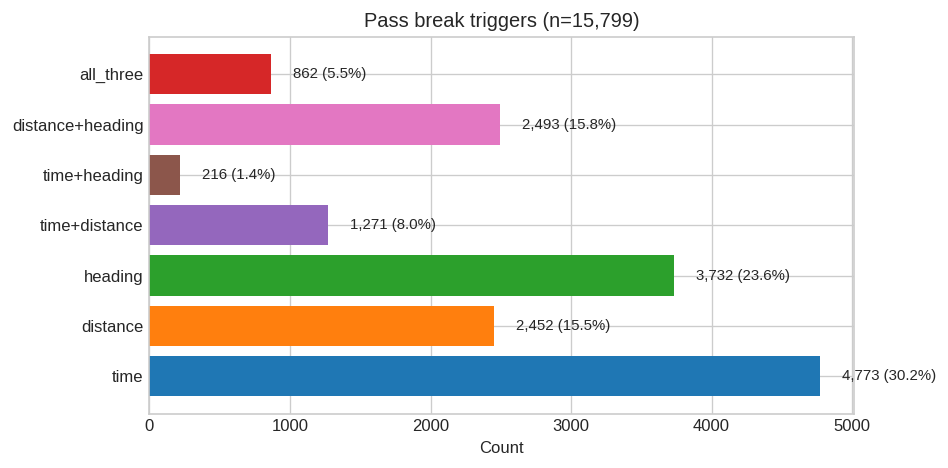

In [8]:
# Classify pass break triggers
break_reasons = {"time": 0, "distance": 0, "heading": 0,
                 "time+distance": 0, "time+heading": 0, "distance+heading": 0,
                 "all_three": 0}

for i in range(1, len(recs)):
    if pass_ids[i] == pass_ids[i - 1]:
        continue
    dt_s = (ts_sorted[i] - ts_sorted[i - 1]) / np.timedelta64(1, "s")
    dist_m = _haversine_m(lats_sorted[i - 1], lons_sorted[i - 1],
                          lats_sorted[i], lons_sorted[i])
    hdg_diff = abs(headings_sorted[i] - headings_sorted[i - 1])
    hdg_diff = min(hdg_diff, 360.0 - hdg_diff)

    t = dt_s > 10.0
    d = dist_m > 100.0
    h = hdg_diff > 90.0

    if t and d and h:
        break_reasons["all_three"] += 1
    elif t and d:
        break_reasons["time+distance"] += 1
    elif t and h:
        break_reasons["time+heading"] += 1
    elif d and h:
        break_reasons["distance+heading"] += 1
    elif t:
        break_reasons["time"] += 1
    elif d:
        break_reasons["distance"] += 1
    elif h:
        break_reasons["heading"] += 1

total_breaks = sum(break_reasons.values())

fig, ax = plt.subplots(figsize=(8, 4))
labels = list(break_reasons.keys())
values = list(break_reasons.values())
colors = ["#1f77b4", "#ff7f0e", "#2ca02c", "#9467bd", "#8c564b", "#e377c2", "#d62728"]
bars = ax.barh(labels, values, color=colors)
ax.set_xlabel("Count")
ax.set_title(f"Pass break triggers (n={total_breaks:,})")
for bar, val in zip(bars, values):
    ax.text(bar.get_width() + total_breaks * 0.01, bar.get_y() + bar.get_height() / 2,
            f"{val:,} ({100 * val / total_breaks:.1f}%)", va="center", fontsize=9)
plt.tight_layout()
plt.show()

## 5. Graph Topology

Degree distribution, edge types (along-pass vs Street Smart spatial), connected components.

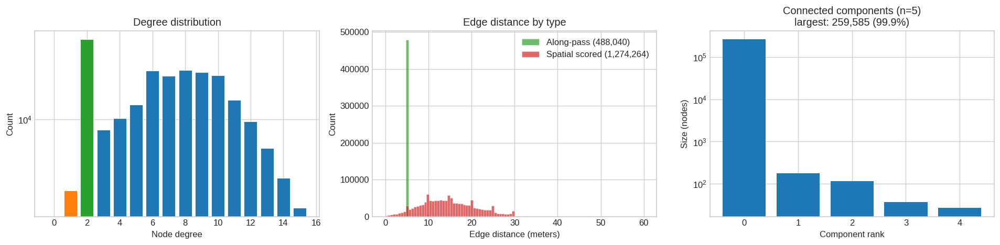

Nodes: 259,946  |  Directed edges: 1,762,304  |  Avg degree: 6.8
Isolated: 0  |  Endpoint: 2,197  |  Mid-block: 54,983  |  Intersection: 202,766
Components: 5  |  Largest: 259,585 (99.9%)
Along-pass edges: 488,040 (median 5.0m)
Spatial edges:    1,274,264 (median 14.3m)


In [9]:
# Pre-compute node arrays
rec_ids_g = np.array(list(graph.adjacency.keys()))
lats_g = np.array([graph.coords[r][0] for r in rec_ids_g])
lons_g = np.array([graph.coords[r][1] for r in rec_ids_g])
yaws_g = np.array([graph.yaw_degrees.get(r, 0.0) for r in rec_ids_g])
degrees_g = np.array([len(graph.adjacency[r]) for r in rec_ids_g])

n_nodes = len(rec_ids_g)
n_edges = sum(len(v) for v in graph.adjacency.values())

is_isolated = degrees_g == 0
is_endpoint = degrees_g == 1
is_midblock = degrees_g == 2
is_intersection = degrees_g > 2

fig, axes = plt.subplots(1, 3, figsize=(16, 4))

# Degree distribution
ax = axes[0]
deg_counts = Counter(degrees_g)
max_deg = min(max(deg_counts.keys()), 15)
x_vals = list(range(max_deg + 1))
y_vals = [deg_counts.get(d, 0) for d in x_vals]
colors = ["#d62728" if d == 0 else "#ff7f0e" if d == 1 else "#2ca02c" if d == 2 else "#1f77b4" for d in x_vals]
ax.bar(x_vals, y_vals, color=colors, edgecolor="white", linewidth=0.5)
ax.set_xlabel("Node degree")
ax.set_ylabel("Count")
ax.set_title("Degree distribution")
ax.set_yscale("log")

# Edge distance by type: along-pass (same pass) vs spatial (cross-pass)
ax = axes[1]
rid_to_pass = dict(zip(rids_sorted, pass_ids))
along_dists = []
spatial_dists = []
for rid in rec_ids_g:
    src_pass = rid_to_pass.get(rid, -1)
    for nb in graph.adjacency[rid]:
        dst_pass = rid_to_pass.get(nb.recording_id, -2)
        if src_pass == dst_pass and src_pass >= 0:
            along_dists.append(nb.distance_m)
        else:
            spatial_dists.append(nb.distance_m)

along_dists = np.array(along_dists)
spatial_dists = np.array(spatial_dists)
ax.hist(along_dists, bins=100, range=(0, 60), alpha=0.7, color="#2ca02c",
        label=f"Along-pass ({len(along_dists):,})", edgecolor="white", linewidth=0.3)
ax.hist(spatial_dists, bins=100, range=(0, 60), alpha=0.7, color="#d62728",
        label=f"Spatial scored ({len(spatial_dists):,})", edgecolor="white", linewidth=0.3)
ax.set_xlabel("Edge distance (meters)")
ax.set_ylabel("Count")
ax.set_title("Edge distance by type")
ax.legend()

# Connected components
ax = axes[2]
rid_to_idx = {r: i for i, r in enumerate(rec_ids_g)}
comp_labels = np.full(n_nodes, -1, dtype=int)
comp_id = 0
for start_idx in range(n_nodes):
    if comp_labels[start_idx] >= 0:
        continue
    queue = [start_idx]
    while queue:
        idx = queue.pop()
        if comp_labels[idx] >= 0:
            continue
        comp_labels[idx] = comp_id
        for nb in graph.adjacency.get(rec_ids_g[idx], []):
            nb_idx = rid_to_idx.get(nb.recording_id)
            if nb_idx is not None and comp_labels[nb_idx] < 0:
                queue.append(nb_idx)
    comp_id += 1

comp_sizes = Counter(comp_labels)
sorted_comps = comp_sizes.most_common()
largest_id, largest_size = sorted_comps[0]
sizes_arr = np.array([sz for _, sz in sorted_comps])
ax.bar(range(min(30, len(sizes_arr))), sizes_arr[:30], color="#1f77b4")
ax.set_xlabel("Component rank")
ax.set_ylabel("Size (nodes)")
ax.set_title(f"Connected components (n={comp_id})\nlargest: {largest_size:,} ({100*largest_size/n_nodes:.1f}%)")
ax.set_yscale("log")

plt.tight_layout()
plt.show()

print(f"Nodes: {n_nodes:,}  |  Directed edges: {n_edges:,}  |  Avg degree: {n_edges/n_nodes:.1f}")
print(f"Isolated: {is_isolated.sum():,}  |  Endpoint: {is_endpoint.sum():,}  |  "
      f"Mid-block: {is_midblock.sum():,}  |  Intersection: {is_intersection.sum():,}")
print(f"Components: {comp_id:,}  |  Largest: {largest_size:,} ({100*largest_size/n_nodes:.1f}%)")
print(f"Along-pass edges: {len(along_dists):,} (median {np.median(along_dists):.1f}m)")
print(f"Spatial edges:    {len(spatial_dists):,} (median {np.median(spatial_dists):.1f}m)")

## 6. Visualize Passes on a Map

Color-code individual vehicle passes on a folium map to verify they trace clean street segments. Focus on a neighborhood for detail.

In [10]:
# Focus area: Times Square
FOCUS_LAT, FOCUS_LON = 40.758, -73.9855
FOCUS_RADIUS_DEG = 0.003  # ~300m

# Filter passes that have recordings in the focus area
local_mask = ((lats_sorted > FOCUS_LAT - FOCUS_RADIUS_DEG) &
              (lats_sorted < FOCUS_LAT + FOCUS_RADIUS_DEG) &
              (lons_sorted > FOCUS_LON - FOCUS_RADIUS_DEG) &
              (lons_sorted < FOCUS_LON + FOCUS_RADIUS_DEG))
local_pass_ids = set(pass_ids[local_mask])
print(f"Passes with recordings near Times Square: {len(local_pass_ids)}")

# Generate distinct colors
import colorsys
def pass_colors(n):
    return [f"#{int(r*255):02x}{int(g*255):02x}{int(b*255):02x}"
            for r, g, b in [colorsys.hsv_to_rgb(i / n, 0.8, 0.9) for i in range(n)]]

if FOLIUM_OK:
    m = folium.Map(location=[FOCUS_LAT, FOCUS_LON], zoom_start=17, tiles="CartoDB positron")
    pcolors = pass_colors(len(local_pass_ids))

    for pidx, pid in enumerate(sorted(local_pass_ids)):
        pmask = recs["pass_id"] == pid
        plats = lats_sorted[pmask]
        plons = lons_sorted[pmask]
        if len(plats) < 2:
            continue
        coords = list(zip(plats.tolist(), plons.tolist()))
        folium.PolyLine(coords, weight=3, color=pcolors[pidx % len(pcolors)],
                        opacity=0.8, popup=f"Pass {pid} ({len(plats)} pts)").add_to(m)
        # Start marker
        folium.CircleMarker(coords[0], radius=5, color=pcolors[pidx % len(pcolors)],
                            fill=True, fill_opacity=1.0, weight=1,
                            popup=f"Pass {pid} START").add_to(m)

    # Overlay intersection edges (cross-pass connections)
    local_rids = set(rids_sorted[local_mask])
    for rid in local_rids:
        if rid not in graph.adjacency:
            continue
        src_pass = rid_to_pass.get(rid, -1)
        lat_s, lon_s = graph.coords[rid]
        for nb in graph.adjacency[rid]:
            dst_pass = rid_to_pass.get(nb.recording_id, -2)
            if src_pass != dst_pass and nb.recording_id in graph.coords:
                lat_d, lon_d = graph.coords[nb.recording_id]
                folium.PolyLine([(lat_s, lon_s), (lat_d, lon_d)],
                                weight=2, color="black", opacity=0.4,
                                dash_array="5 5").add_to(m)

    m.save("trajectory_passes_map.html")
    print("Saved: trajectory_passes_map.html")
    print("Colored lines = vehicle passes, dashed black = cross-pass intersection edges")
    display(m)
else:
    fig, ax = plt.subplots(figsize=(10, 10))
    pcolors = pass_colors(len(local_pass_ids))
    for pidx, pid in enumerate(sorted(local_pass_ids)):
        pmask = recs["pass_id"] == pid
        plats = lats_sorted[pmask]
        plons = lons_sorted[pmask]
        if len(plats) >= 2:
            ax.plot(plons, plats, "-", color=pcolors[pidx % len(pcolors)],
                    linewidth=1.5, alpha=0.8)
            ax.plot(plons[0], plats[0], "o", color=pcolors[pidx % len(pcolors)], markersize=4)
    ax.set_aspect("equal")
    ax.set_title(f"Vehicle passes near Times Square ({len(local_pass_ids)} passes)")
    plt.tight_layout()
    plt.show()

Passes with recordings near Times Square: 101
Saved: trajectory_passes_map.html
Colored lines = vehicle passes, dashed black = cross-pass intersection edges


## 7. Intersection Close-Up

Zoom into a high-degree node to verify: green = along-pass edges (same vehicle trajectory), red dashed = spatial edges (Street Smart scored cross-pass connections).

In [11]:
# Find a high-degree node near focus area as our intersection example
local_g_mask = ((lats_g > FOCUS_LAT - FOCUS_RADIUS_DEG) &
                (lats_g < FOCUS_LAT + FOCUS_RADIUS_DEG) &
                (lons_g > FOCUS_LON - FOCUS_RADIUS_DEG) &
                (lons_g < FOCUS_LON + FOCUS_RADIUS_DEG))
local_g_idx = np.where(local_g_mask)[0]
if len(local_g_idx) > 0:
    # Pick the highest-degree node in the area
    best = local_g_idx[np.argmax(degrees_g[local_g_idx])]
    center_rid = rec_ids_g[best]
    center_lat, center_lon = graph.coords[center_rid]
    print(f"Center node: {center_rid}, degree={degrees_g[best]}, "
          f"yaw={yaws_g[best]:.1f}, at ({center_lat:.6f}, {center_lon:.6f})")

    # Gather 2-hop neighborhood
    hop1 = set(nb.recording_id for nb in graph.adjacency.get(center_rid, []))
    hop2 = set()
    for rid1 in hop1:
        for nb in graph.adjacency.get(rid1, []):
            hop2.add(nb.recording_id)
    neighborhood = {center_rid} | hop1 | hop2

    if FOLIUM_OK:
        m2 = folium.Map(location=[center_lat, center_lon], zoom_start=19, tiles="CartoDB positron")

        # Draw edges in the neighborhood
        for rid in neighborhood:
            if rid not in graph.adjacency or rid not in graph.coords:
                continue
            lat_s, lon_s = graph.coords[rid]
            src_pass = rid_to_pass.get(rid, -1)
            for nb in graph.adjacency[rid]:
                if nb.recording_id not in neighborhood or nb.recording_id not in graph.coords:
                    continue
                lat_d, lon_d = graph.coords[nb.recording_id]
                dst_pass = rid_to_pass.get(nb.recording_id, -2)
                if src_pass == dst_pass:
                    color, weight, dash = "#2ca02c", 3, None
                else:
                    color, weight, dash = "#d62728", 2, "5 5"
                folium.PolyLine([(lat_s, lon_s), (lat_d, lon_d)],
                                weight=weight, color=color, opacity=0.8,
                                dash_array=dash).add_to(m2)

        # Draw nodes with yaw arrows
        arrow_len = 0.00008
        for rid in neighborhood:
            if rid not in graph.coords:
                continue
            lat_n, lon_n = graph.coords[rid]
            yaw_n = graph.yaw_degrees.get(rid, 0)
            deg_n = len(graph.adjacency.get(rid, []))

            if rid == center_rid:
                color, radius = "#9467bd", 8
            elif deg_n > 2:
                color, radius = "#d62728", 6
            elif deg_n == 1:
                color, radius = "#ff7f0e", 5
            else:
                color, radius = "#1f77b4", 4

            folium.CircleMarker(
                [lat_n, lon_n], radius=radius, color=color, fill=True,
                fill_opacity=0.9, weight=1,
                popup=f"<b>{rid}</b><br>deg={deg_n}<br>yaw={yaw_n:.1f}°<br>"
                      f"pass={rid_to_pass.get(rid, '?')}",
            ).add_to(m2)

            # Yaw arrow
            yaw_rad = math.radians(yaw_n)
            dlat = arrow_len * math.cos(yaw_rad)
            dlon = arrow_len * math.sin(yaw_rad) / math.cos(math.radians(lat_n))
            folium.PolyLine([(lat_n, lon_n), (lat_n + dlat, lon_n + dlon)],
                            weight=2, color=color, opacity=0.9).add_to(m2)

        m2.save("trajectory_intersection_closeup.html")
        print("Saved: trajectory_intersection_closeup.html")
        print("Green = along-pass, Red dashed = cross-pass, Purple = center node")
        display(m2)
    else:
        print("Install folium for interactive map")

Center node: W0ECPL1K, degree=19, yaw=206.7, at (40.759854, -73.984215)
Saved: trajectory_intersection_closeup.html
Green = along-pass, Red dashed = cross-pass, Purple = center node


## 8. Heading Distribution & Manhattan Grid Alignment

Vehicle headings should cluster around Manhattan's grid angles (~29/209 for avenues, ~119/299 for cross-streets).

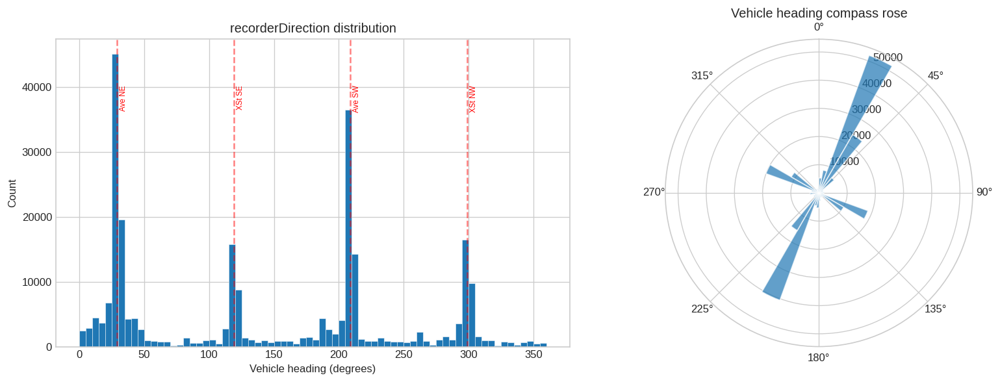

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram
ax = axes[0]
ax.hist(yaws_g, bins=72, range=(0, 360), color="#1f77b4", edgecolor="white", linewidth=0.3)
ax.set_xlabel("Vehicle heading (degrees)")
ax.set_ylabel("Count")
ax.set_title("recorderDirection distribution")
for angle, label in [(29, "Ave NE"), (209, "Ave SW"), (119, "XSt SE"), (299, "XSt NW")]:
    ax.axvline(angle, color="red", linestyle="--", alpha=0.5)
    ax.text(angle + 2, ax.get_ylim()[1] * 0.85, label, fontsize=7, color="red", rotation=90, va="top")

# Polar compass rose
ax_polar = fig.add_subplot(122, projection="polar")
bins = np.linspace(0, 360, 37)  # 10-degree bins
counts, _ = np.histogram(yaws_g, bins=bins)
theta = np.radians((bins[:-1] + bins[1:]) / 2)
width = np.radians(360 / 36)
ax_polar.bar(theta, counts, width=width, bottom=0, alpha=0.7, color="#1f77b4", edgecolor="white")
ax_polar.set_theta_zero_location("N")
ax_polar.set_theta_direction(-1)
ax_polar.set_title("Vehicle heading compass rose", pad=20)
axes[1].set_visible(False)

plt.tight_layout()
plt.show()

## 9. Simulated Random Walks

Run random walks on the trajectory graph to verify navigability. Compare walk quality against the old spatial-buffer graph if a precomputed one exists.

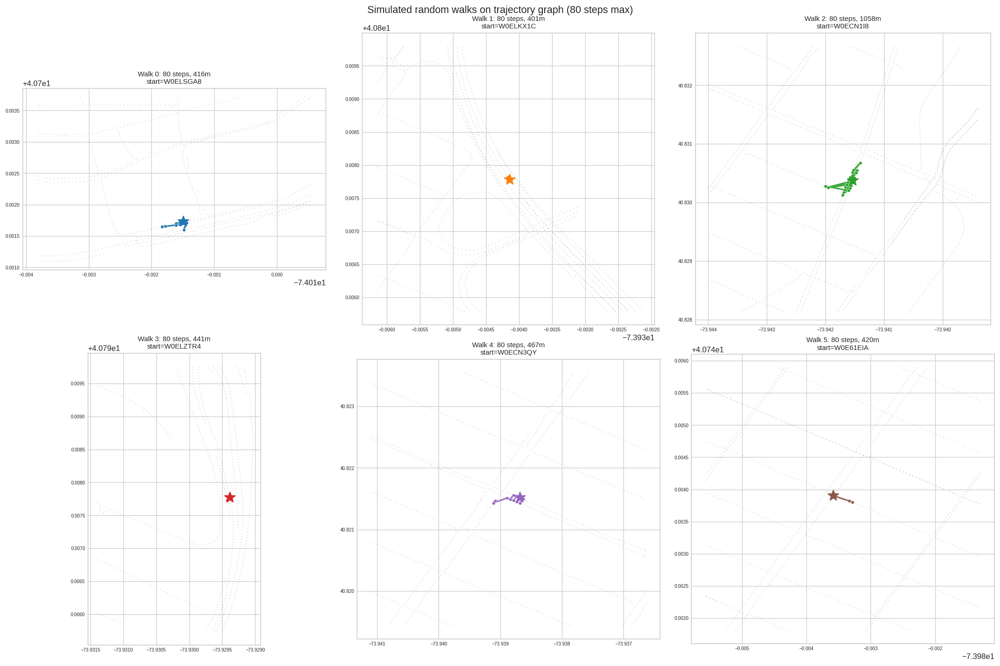


Walk   Steps   Dist (m)   Stuck?   Unique nodes   Start
0      80      416        False    10             W0ELSGA8
1      80      401        False    2              W0ELKX1C
2      80      1058       False    21             W0ECN1I8
3      80      441        False    2              W0ELZTR4
4      80      467        False    11             W0ECN3QY
5      80      420        False    3              W0E61EIA


In [13]:
def random_walk(g, start_rid, n_steps=50, seed=0, bearing_tol=45.0):
    """Random walk on a StreetGraph. Returns list of step dicts."""
    rng = np.random.default_rng(seed)
    trajectory = []
    rid = start_rid
    arrival_face = "F"

    for step in range(n_steps):
        lat, lon = g.coords.get(rid, (0, 0))
        yaw = g.yaw_degrees.get(rid, 0)
        available = [f for f in ["F", "R", "B", "L"] if f != arrival_face]
        trajectory.append({"step": step, "rid": rid, "lat": lat, "lon": lon, "yaw": yaw})

        rng.shuffle(available)
        moved = False
        for face in available:
            nb = g.resolve_face_to_neighbor(rid, face, bearing_tol)
            if nb is not None:
                trajectory[-1]["face_chosen"] = face
                trajectory[-1]["dist_m"] = nb.distance_m
                arrival_face = g.arrival_face(rid, nb.recording_id)
                rid = nb.recording_id
                moved = True
                break
        if not moved:
            trajectory[-1]["face_chosen"] = "STUCK"
            break
    return trajectory

# Pick starting nodes from the largest component
largest_mask = comp_labels == largest_id
largest_rids = rec_ids_g[largest_mask]
# Prefer intersection nodes as starting points
intersection_rids = largest_rids[degrees_g[largest_mask] > 2]
walk_rng = np.random.default_rng(42)
if len(intersection_rids) >= 6:
    start_rids = walk_rng.choice(intersection_rids, 6, replace=False)
else:
    start_rids = walk_rng.choice(largest_rids, 6, replace=False)

all_walks = []
for i, start in enumerate(start_rids):
    traj = random_walk(graph, start, n_steps=80, seed=i)
    all_walks.append(traj)

# Plot walks
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
walk_colors = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b"]

for idx, (traj, ax) in enumerate(zip(all_walks, axes.flat)):
    wlats = np.array([t["lat"] for t in traj])
    wlons = np.array([t["lon"] for t in traj])
    stuck = traj[-1].get("face_chosen") == "STUCK"
    total_dist = sum(t.get("dist_m", 0) for t in traj)

    # Background graph nodes
    pad = 0.002
    bg_mask = ((lats_g > wlats.min() - pad) & (lats_g < wlats.max() + pad) &
               (lons_g > wlons.min() - pad) & (lons_g < wlons.max() + pad))
    ax.scatter(lons_g[bg_mask], lats_g[bg_mask], s=0.5, alpha=0.15, c="gray")

    # Walk trace
    ax.plot(wlons, wlats, "-", color=walk_colors[idx], linewidth=2, alpha=0.9)
    ax.scatter(wlons, wlats, s=15, c=walk_colors[idx], zorder=3, edgecolors="white", linewidth=0.3)
    ax.plot(wlons[0], wlats[0], "*", color=walk_colors[idx], markersize=15, zorder=5)
    if stuck:
        ax.plot(wlons[-1], wlats[-1], "X", color="red", markersize=12, zorder=5)

    status = f"STUCK@{len(traj)}" if stuck else f"{len(traj)} steps"
    ax.set_title(f"Walk {idx}: {status}, {total_dist:.0f}m\nstart={start_rids[idx]}", fontsize=9)
    ax.set_aspect("equal")
    ax.tick_params(labelsize=6)

plt.suptitle("Simulated random walks on trajectory graph (80 steps max)", fontsize=13)
plt.tight_layout()
plt.show()

# Summary stats
print(f"\n{'Walk':<6} {'Steps':<7} {'Dist (m)':<10} {'Stuck?':<8} {'Unique nodes':<14} {'Start'}")
for i, traj in enumerate(all_walks):
    steps = len(traj)
    dist = sum(t.get("dist_m", 0) for t in traj)
    stuck = traj[-1].get("face_chosen") == "STUCK"
    unique = len(set(t["rid"] for t in traj))
    print(f"{i:<6} {steps:<7} {dist:<10.0f} {str(stuck):<8} {unique:<14} {start_rids[i]}")

## 10. Walk on Folium Map

Render one walk on an interactive map with panorama face images direction indicators.

In [14]:
# Pick the longest walk
best_walk_idx = max(range(len(all_walks)), key=lambda i: len(all_walks[i]))
traj = all_walks[best_walk_idx]
wlats = [t["lat"] for t in traj]
wlons = [t["lon"] for t in traj]

if FOLIUM_OK:
    center = [np.mean(wlats), np.mean(wlons)]
    m3 = folium.Map(location=center, zoom_start=16, tiles="CartoDB positron")

    # Draw background graph edges near the walk
    pad = 0.003
    walk_rids = set(t["rid"] for t in traj)
    bg_rids = set()
    for rid in rec_ids_g:
        lat_r, lon_r = graph.coords.get(rid, (0, 0))
        if (min(wlats) - pad < lat_r < max(wlats) + pad and
            min(wlons) - pad < lon_r < max(wlons) + pad):
            bg_rids.add(rid)

    for rid in bg_rids:
        if rid not in graph.adjacency:
            continue
        lat_s, lon_s = graph.coords[rid]
        for nb in graph.adjacency[rid]:
            if nb.recording_id in bg_rids and nb.recording_id in graph.coords:
                lat_d, lon_d = graph.coords[nb.recording_id]
                folium.PolyLine([(lat_s, lon_s), (lat_d, lon_d)],
                                weight=1, color="gray", opacity=0.2).add_to(m3)

    # Draw walk trace
    walk_coords = list(zip(wlats, wlons))
    folium.PolyLine(walk_coords, weight=4, color="#d62728", opacity=0.9).add_to(m3)

    # Step markers
    for step_data in traj:
        s = step_data["step"]
        lat, lon = step_data["lat"], step_data["lon"]
        yaw = step_data["yaw"]
        face = step_data.get("face_chosen", "?")

        if s == 0:
            icon_color = "green"
            prefix = "START"
        elif face == "STUCK":
            icon_color = "red"
            prefix = "STUCK"
        else:
            icon_color = "blue"
            prefix = f"Step {s}"

        folium.CircleMarker(
            [lat, lon], radius=6, color=icon_color, fill=True, fill_opacity=0.8,
            weight=1,
            popup=f"<b>{prefix}</b><br>{step_data['rid']}<br>yaw={yaw:.1f}°<br>chose={face}",
        ).add_to(m3)

        # Yaw arrow
        arrow_len = 0.00012
        yaw_rad = math.radians(yaw)
        dlat = arrow_len * math.cos(yaw_rad)
        dlon = arrow_len * math.sin(yaw_rad) / math.cos(math.radians(lat))
        folium.PolyLine([(lat, lon), (lat + dlat, lon + dlon)],
                        weight=2, color=icon_color, opacity=0.8).add_to(m3)

    m3.save("trajectory_walk_map.html")
    print(f"Saved: trajectory_walk_map.html (Walk {best_walk_idx}, {len(traj)} steps)")
    display(m3)
else:
    print("Install folium for interactive map")

Saved: trajectory_walk_map.html (Walk 0, 80 steps)


## 11. Parameter Sensitivity

How does changing the pass segmentation thresholds and spatial scoring radius affect graph structure and connectivity?

In [ ]:
# Sweep pass_time_gap_s and spatial_radius_m
time_gaps = [3, 5, 10, 20, 30, 60]
spatial_radii = [10, 15, 20, 30, 50]

# Quick pass segmentation sweep (fast — no graph build needed)
print("Pass segmentation vs time_gap_s (distance=100m, heading=90°):")
print(f"{'time_gap_s':<12} {'passes':<10} {'median_size':<14} {'single_rec_passes':<20}")
for tg in time_gaps:
    pids = np.zeros(len(recs), dtype=np.int64)
    cp = 0
    for i in range(1, len(recs)):
        dt = (ts_sorted[i] - ts_sorted[i-1]) / np.timedelta64(1, "s")
        dist = _haversine_m(lats_sorted[i-1], lons_sorted[i-1], lats_sorted[i], lons_sorted[i])
        hdiff = abs(headings_sorted[i] - headings_sorted[i-1])
        hdiff = min(hdiff, 360.0 - hdiff)
        if dt > tg or dist > 100.0 or hdiff > 90.0:
            cp += 1
        pids[i] = cp
    n_p = cp + 1
    szs = np.bincount(pids)
    print(f"{tg:<12} {n_p:<10,} {np.median(szs):<14.0f} {(szs == 1).sum():<20,}")

print("\n--- Spatial radius sweep (full graph builds — may take a few minutes) ---")
results = []
for radius in spatial_radii:
    c = SimpleNamespace(**vars(cfg))
    c.spatial_radius_m = radius
    g = build_trajectory_graph(PARQUET_PATH, c)
    n = len(g.adjacency)
    e = sum(len(v) for v in g.adjacency.values())
    deg = np.array([len(v) for v in g.adjacency.values()])
    n_turns = (deg > 2).sum()

    # Quick component count
    r2i = {r: i for i, r in enumerate(list(g.adjacency.keys()))}
    cl = np.full(n, -1, dtype=int)
    ci = 0
    for s in range(n):
        if cl[s] >= 0:
            continue
        stk = [s]
        while stk:
            nd = stk.pop()
            if cl[nd] >= 0:
                continue
            cl[nd] = ci
            rk = list(g.adjacency.keys())[nd]
            for nb in g.adjacency.get(rk, []):
                ni = r2i.get(nb.recording_id)
                if ni is not None and cl[ni] < 0:
                    stk.append(ni)
        ci += 1
    largest_pct = 100 * Counter(cl).most_common(1)[0][1] / n

    results.append({"radius_m": radius, "nodes": n, "edges": e,
                    "avg_deg": e/n, "turn_nodes": n_turns, "components": ci,
                    "largest_pct": largest_pct})
    print(f"  radius={radius}m: {e:,} edges, avg_deg={e/n:.1f}, "
          f"turns={n_turns:,} ({100*n_turns/n:.1f}%), "
          f"components={ci}, largest={largest_pct:.1f}%")

results_df = pd.DataFrame(results)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

ax = axes[0]
ax.plot(results_df["radius_m"], results_df["edges"] / 1000, "o-", color="#1f77b4")
ax.set_xlabel("Spatial radius (m)")
ax.set_ylabel("Total edges (thousands)")
ax.set_title("Edges vs spatial radius")

ax = axes[1]
ax.plot(results_df["radius_m"], results_df["turn_nodes"] / 1000, "o-", color="#d62728")
ax.set_xlabel("Spatial radius (m)")
ax.set_ylabel("Turn nodes (thousands)")
ax.set_title("Navigable intersections vs radius")

ax = axes[2]
ax.plot(results_df["radius_m"], results_df["largest_pct"], "o-", color="#2ca02c")
ax.set_xlabel("Spatial radius (m)")
ax.set_ylabel("Largest component (%)")
ax.set_title("Connectivity vs spatial radius")
ax.set_ylim(0, 105)
ax.axhline(99, color="gray", linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()

Pass segmentation vs time_gap_s (distance=100m, heading=90°):
time_gap_s   passes     median_size    single_rec_passes   
3            20,015     4              7,035               
5            17,320     5              4,916               
10           15,800     6              4,236               
20           14,484     6              3,880               
30           13,731     6              3,745               
60           11,608     5              3,577               

--- Spatial radius sweep (full graph builds — may take a few minutes) ---
[trajectory_graph] Loading metadata from ../../data/cyclomedia/manhattan_2025_1_1k_scratch.parquet
[trajectory_graph] 259,946 unique recordings with timestamps
[trajectory_graph] Segmented into 15,800 vehicle passes
[trajectory_graph] Pass sizes: median=6, mean=16.5, max=1530, single-recording passes=4236
[trajectory_graph] Along-pass edges: 244,020 (bidirectional)
[trajectory_graph] Cross-pass spatial edges (Street Smart scored): 178,968


## 12. Summary

In [ ]:
print("=" * 60)
print("TRAJECTORY GRAPH EDA SUMMARY")
print("=" * 60)
print(f"Source:               {PARQUET_PATH}")
print(f"Raw recordings:       {len(recs):>10,}")
print()
print(f"Vehicle passes:       {n_passes:>10,}")
print(f"  Median size:        {np.median(pass_stats['n_recs']):>10.0f} recordings")
print(f"  Median length:      {np.median(pass_stats['length_m']):>10.0f} m")
print(f"  Single-rec passes:  {(pass_stats['n_recs'] == 1).sum():>10,}")
print()
print(f"Graph nodes:          {n_nodes:>10,}")
print(f"Graph edges (dir):    {n_edges:>10,}")
print(f"Avg degree:           {n_edges / n_nodes:>10.1f}")
print()
print(f"Along-pass edges:     {len(along_dists):>10,}  (median {np.median(along_dists):.1f}m)")
print(f"Spatial scored edges: {len(spatial_dists):>10,}  (median {np.median(spatial_dists):.1f}m)")
print()
print(f"Mid-block (deg 2):    {is_midblock.sum():>10,}  ({100 * is_midblock.mean():.1f}%)")
print(f"Intersection (deg>2): {is_intersection.sum():>10,}  ({100 * is_intersection.mean():.1f}%)")
print(f"Endpoint (deg 1):     {is_endpoint.sum():>10,}  ({100 * is_endpoint.mean():.1f}%)")
print(f"Isolated (deg 0):     {is_isolated.sum():>10,}  ({100 * is_isolated.mean():.1f}%)")
print()
print(f"Connected components: {comp_id:>10,}")
print(f"Largest component:    {largest_size:>10,}  ({100*largest_size/n_nodes:.1f}%)")
print()

# Walk navigability
n_completed = sum(1 for t in all_walks if t[-1].get("face_chosen") != "STUCK")
avg_steps = np.mean([len(t) for t in all_walks])
avg_dist = np.mean([sum(s.get("dist_m", 0) for s in t) for t in all_walks])
print(f"Random walks (n=6, max=80 steps):")
print(f"  Completed full 80:  {n_completed} / {len(all_walks)}")
print(f"  Avg steps:          {avg_steps:.0f}")
print(f"  Avg distance:       {avg_dist:.0f}m")
print()
print(f"Scoring function:     S(d,a) = a>π/4 ? -1 : (1-a/π)/(1+0.1·√d)")
print(f"Spatial radius:       {cfg.spatial_radius_m}m")
print(f"Max spatial neighbors:{cfg.max_spatial_neighbors}")
print(f"Bridge radius:        {cfg.bridge_radius_m}m")
print("=" * 60)